In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torchvision
from torch.autograd import Variable
import time as t
import cv2
from torchvision import utils
import tensorflow as tf
from itertools import chain
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import v2 as transforms
import re

import seaborn as sns
from sklearn.manifold import TSNE

from utils import * 

In [2]:
def extract_base_name(filepath):
    return re.sub(r'(-[a-zA-Z0-9]+)?\.\w+$', '', os.path.basename(filepath))

In [3]:
# Dataset

trainval_folder = 'data\\PRPD_dataset\\TrainVal'
test_folder = 'data\\PRPD_dataset\\Test'

def get_dataset(path, split=''):
    images_path = []
    for dirpath, dirnames, files in os.walk(path):
        for file in files:
            path = os.path.join(dirpath, file)
            motor = os.path.basename(dirpath)
            defect = os.path.basename(os.path.dirname(dirpath))
            images_path.append((path, motor, defect, split))
    return images_path

trainval_path = os.path.join(os.path.dirname(os.getcwd()), trainval_folder)
test_path = os.path.join(os.path.dirname(os.getcwd()), test_folder)

classes = os.listdir(trainval_path)
print('Defects: {}'.format(classes))

trainval_ds = get_dataset(trainval_path, split='Train-val')
test_df = get_dataset(test_path, split='Test')

# Create pandas dataframe
df = pd.DataFrame(trainval_ds+test_df, columns=['Filename', 'Motor', 'Defect', 'Split'])
df['Class'], unique_labels = pd.factorize(df['Defect'])

Defects: ['corona', 'internal', 'surface']


In [4]:
df.head()

,Filename,Motor,Defect,Split,Class
0,C:\Users\jazg2\OneDrive\Documents\Pesquisa_Mes...,REAL2,corona,Train-val,0
1,C:\Users\jazg2\OneDrive\Documents\Pesquisa_Mes...,REAL2,corona,Train-val,0
2,C:\Users\jazg2\OneDrive\Documents\Pesquisa_Mes...,REAL2,corona,Train-val,0
3,C:\Users\jazg2\OneDrive\Documents\Pesquisa_Mes...,REAL2,corona,Train-val,0
4,C:\Users\jazg2\OneDrive\Documents\Pesquisa_Mes...,REAL2,corona,Train-val,0


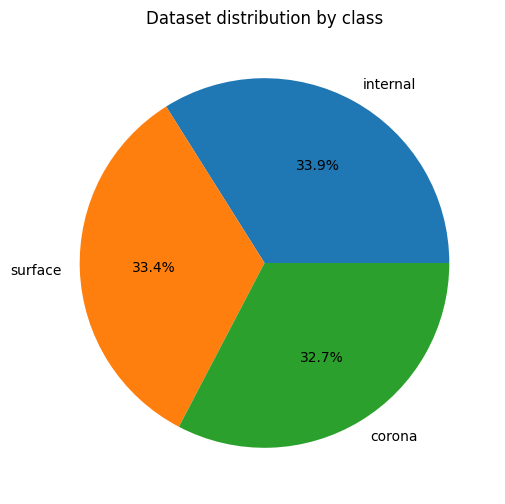

In [5]:
plt.figure(figsize=(6,6))
df.Defect.value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.ylabel('')
plt.title('Dataset distribution by class')
plt.show()

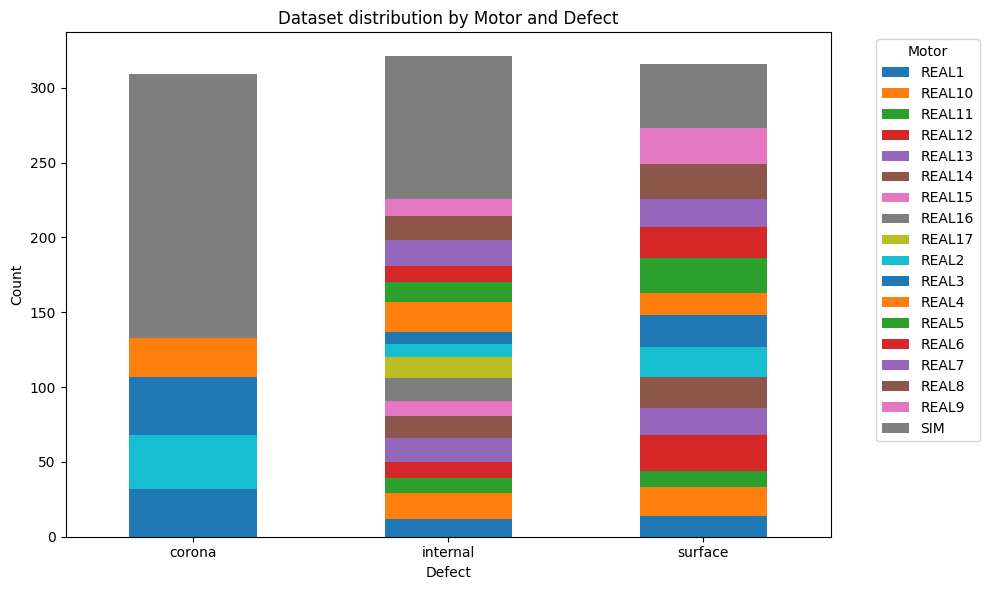

In [6]:
# Count defects grouped by motor
defect_motor_counts = df.groupby('Defect')['Motor'].value_counts().unstack(fill_value=0)

# Plotting
plt.figure(figsize=(10, 6))  # Adjust the figure size
defect_motor_counts.plot(kind='bar', stacked=True, ax=plt.gca())
plt.title('Dataset distribution by Motor and Defect')
plt.xlabel('Defect')
plt.ylabel('Count')
plt.legend(title='Motor', bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside the plot
plt.xticks(rotation=0)  # Optional: rotate x-axis labels
plt.tight_layout()  # Adjust layout to fit everything nicely
plt.show()

In [7]:
shape = cv2.imread(trainval_ds[0][0]).shape
print('Image shape: {}'.format(shape))

Image shape: (440, 570, 3)


In [8]:
class ImageDataset(Dataset):
    def __init__(self, df: pd.DataFrame, transform=None):
        self.df = df
        self.filenames = self.df['Filename'].values
        self.labels = self.df['Class'].values
        self.defect = self.df['Defect'].values
        self.images = np.zeros((len(self.labels), 128, 165, 3), dtype= np.uint8)
        self.transform = transform
        self.getImages()

    def getImages(self):
        for idx, filename in enumerate(self.filenames):
            img = cv2.imread(filename)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (165, 128), interpolation = cv2.INTER_AREA)
            self.images[idx] = img

    def toTensor(self, data):
        image = data.transpose((2,0,1))
        return torch.from_numpy(image)

    def normalize(self, image_arr):
        return (image_arr - image_arr.min()) / (image_arr.max() - image_arr.min())
    
    def __getitem__(self, idx):
        x = self.normalize(self.images[idx])
        x = self.toTensor(x)
        y = self.labels[idx]
        if self.transform:
            x = self.transform(x)
        return x,y

    def __len__(self):
        return len(self.filenames)

In [9]:
def min_max_normalize(images):
    # Ensure the input is a numpy array
    images = np.array(images, dtype=np.float32)
    
    # Initialize an array for normalized images
    normalized_images = np.empty_like(images)
    
    # Normalize each image individually
    for i in range(images.shape[0]):
        img = images[i]
        min_val = np.min(img)
        max_val = np.max(img)
        normalized_images[i] = (img - min_val) / (max_val - min_val)
    
    return normalized_images

In [10]:
transform = transforms.Compose([transforms.ToDtype(torch.float32, scale=True)])
dataset = ImageDataset(df, transform=transform)

## PCA

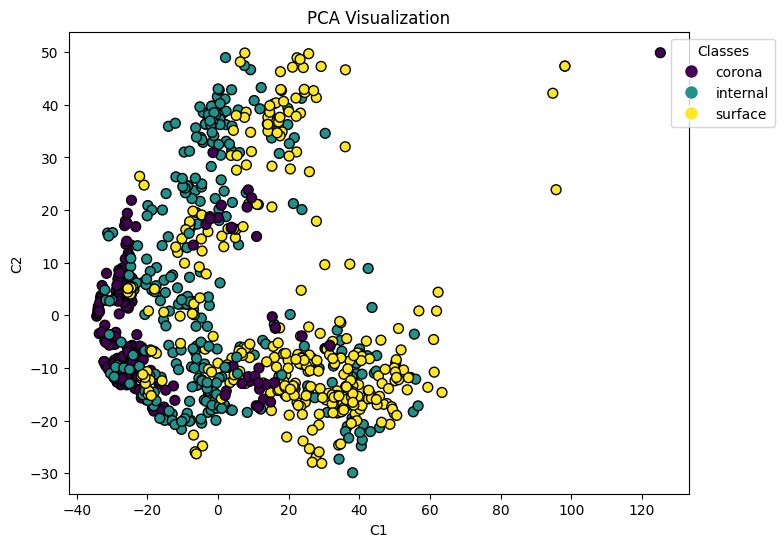

In [11]:
from sklearn.decomposition import PCA

# Apply PCA
num_images = len(dataset)
X = min_max_normalize(dataset.images)
X_flat = X.reshape(num_images, -1)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_flat)

# Plot PCA
plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=dataset.labels, cmap='viridis', edgecolor='k', s=50)

# Create a legend
unique_labels = np.unique(dataset.labels)
unique_defects = np.unique(dataset.defect)
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=10) for label in unique_labels]

plt.legend(handles, unique_defects , title='Classes', loc='upper right', bbox_to_anchor=(1.15, 1))
plt.title('PCA Visualization')
plt.xlabel('C1')
plt.ylabel('C2')
plt.show()

## t-SNE

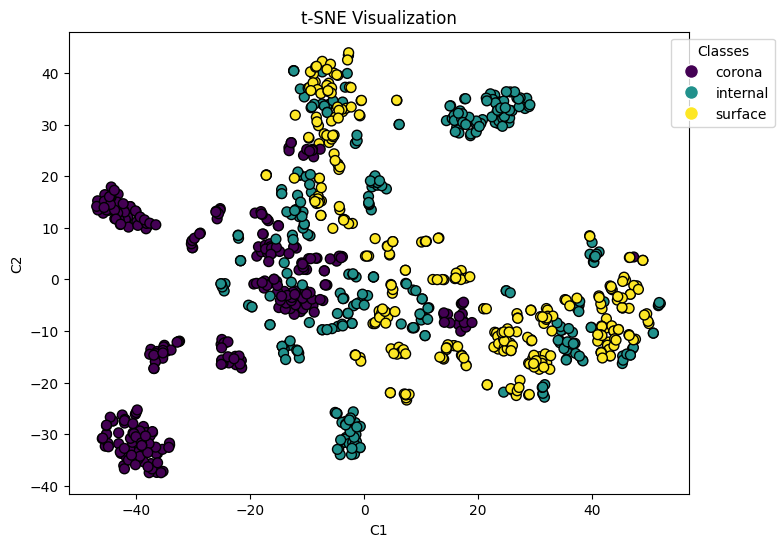

In [12]:
from sklearn.manifold import TSNE

# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_flat)

# Plot t-SNE
plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=dataset.labels, cmap='viridis', edgecolor='k', s=50)

# Create a legend
unique_labels = np.unique(dataset.labels)
unique_defects = np.unique(dataset.defect)
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=10) for label in unique_labels]

plt.legend(handles, unique_defects , title='Classes', loc='upper right', bbox_to_anchor=(1.15, 1))

plt.title('t-SNE Visualization')
plt.xlabel('C1')
plt.ylabel('C2')
plt.show()

## UMAP

C:\Users\jazg2\miniconda3\envs\RL-env\Lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


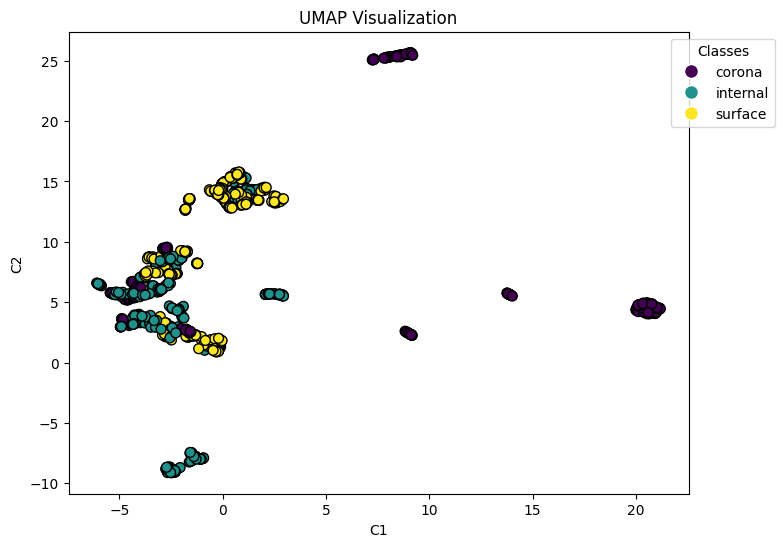

In [13]:
import umap

# Apply UMAP
umap_model = umap.UMAP(n_components=2, random_state=42)
X_umap = umap_model.fit_transform(X_flat)

# Plot UMAP
plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_umap[:, 0], X_umap[:, 1], c=dataset.labels, cmap='viridis', edgecolor='k', s=50)

# Create a legend
unique_labels = np.unique(dataset.labels)
unique_defects = np.unique(dataset.defect)
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=10) for label in unique_labels]

plt.legend(handles, unique_defects , title='Classes', loc='upper right', bbox_to_anchor=(1.15, 1))

plt.title('UMAP Visualization')
plt.xlabel('C1')
plt.ylabel('C2')
plt.show()

## Texture and Statistical Feature Analysis

In [14]:
from skimage.feature import graycomatrix, graycoprops

def get_texture_properties(image):
    distances = [1,3,5,8]  # pixel distance
    angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]  # directions (0°, 45°, 90°, 135°)
    glcm = graycomatrix(image, distances=distances, angles=angles, levels=256)

    contrast = graycoprops(glcm, 'contrast')
    correlation = graycoprops(glcm, 'correlation')
    energy = graycoprops(glcm, 'energy')
    #homogeneity = graycoprops(glcm, 'homogeneity')
    dissimilarity = graycoprops(glcm, 'dissimilarity')
    #asm = graycoprops(glcm, 'ASM')

    return (np.mean(contrast), np.mean(correlation), np.mean(energy), np.mean(dissimilarity))

In [15]:
from scipy.stats import skew, kurtosis

texture_features = []

for idx, image in enumerate(dataset.images):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    glcm_features = get_texture_properties(gray)
    # Calculate statistics for the grayscale image
    just_gray = gray[gray != 0]
    mean = np.mean(just_gray)
    var  = np.var(just_gray)
    skewness = skew(just_gray.flatten())
    kurt = kurtosis(just_gray.flatten())
    
    texture_features.append({'Filename': dataset.filenames[idx], 'Contrast': glcm_features[0], 
                             'Correlation': glcm_features[1], 'Energy': glcm_features[2],
                             'Dissimilarity': glcm_features[3],
                             'Mean': mean, 'Kurtosis': kurt,
                             'Variance': var, 'Skewness': skewness})

# Convert the list of dictionaries to a DataFrame
glcm_df = pd.DataFrame(texture_features)
glcm_df.set_index('Filename', inplace=True)  # Set filename as the index to match original_df

In [16]:
df_texture = df.join(glcm_df, on='Filename', how='left')

In [17]:
df_texture.head()

,Filename,Motor,Defect,Split,Class,Contrast,Correlation,Energy,Dissimilarity,Mean,Kurtosis,Variance,Skewness
0,C:\Users\jazg2\OneDrive\Documents\Pesquisa_Mes...,REAL2,corona,Train-val,0,815.526694,0.610691,0.940221,5.617074,140.764192,-0.896629,4308.933478,-0.629142
1,C:\Users\jazg2\OneDrive\Documents\Pesquisa_Mes...,REAL2,corona,Train-val,0,688.415765,0.553298,0.945413,4.973393,124.705160,-1.108421,4312.773020,-0.388756
2,C:\Users\jazg2\OneDrive\Documents\Pesquisa_Mes...,REAL2,corona,Train-val,0,856.246417,0.622638,0.933850,5.984863,137.029126,-0.964382,4578.599152,-0.590478
3,C:\Users\jazg2\OneDrive\Documents\Pesquisa_Mes...,REAL2,corona,Train-val,0,641.557232,0.548016,0.949251,4.658152,125.724230,-1.089167,4118.454072,-0.395278
4,C:\Users\jazg2\OneDrive\Documents\Pesquisa_Mes...,REAL2,corona,Train-val,0,605.478426,0.564366,0.947994,4.504603,119.644993,-1.182020,4349.292696,-0.329122


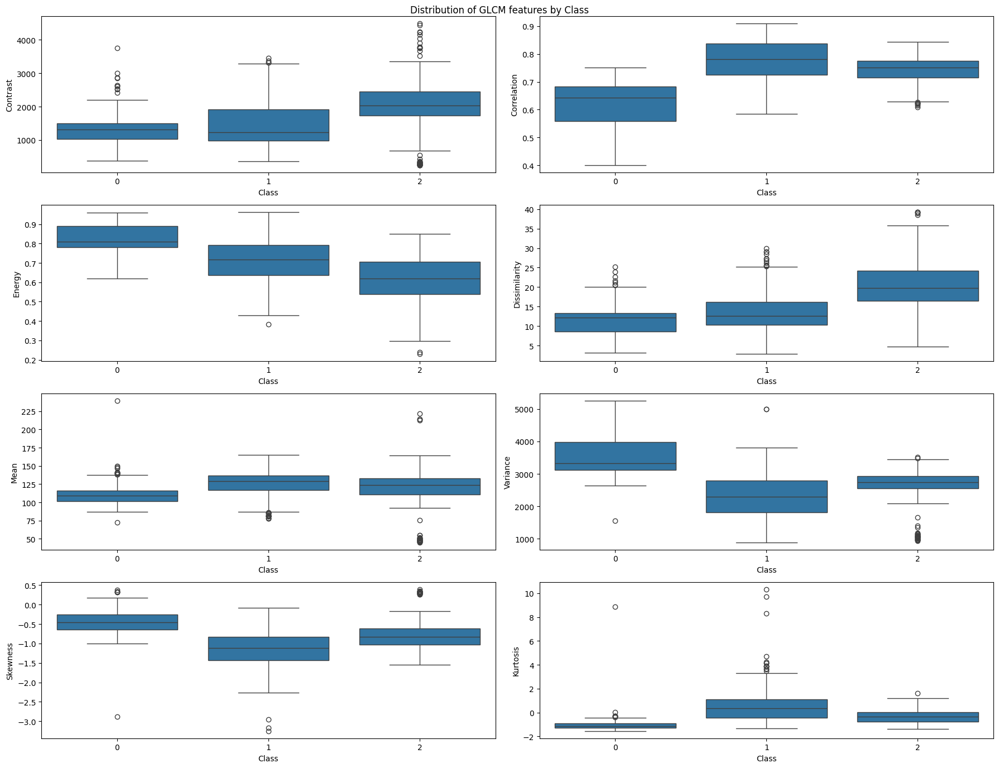

In [18]:
plt.figure(figsize=(18, 14))

features = ['Contrast', 'Correlation', 'Energy',
            'Dissimilarity', 'Mean', 'Variance',
            'Skewness', 'Kurtosis']

for idx, feature in enumerate(features):
    plt.subplot(4,2,idx+1)
    sns.boxplot(x='Class', y=feature, data=df_texture)
plt.suptitle('Distribution of GLCM features by Class')
plt.tight_layout()
plt.show()

<Figure size 1800x1400 with 0 Axes>

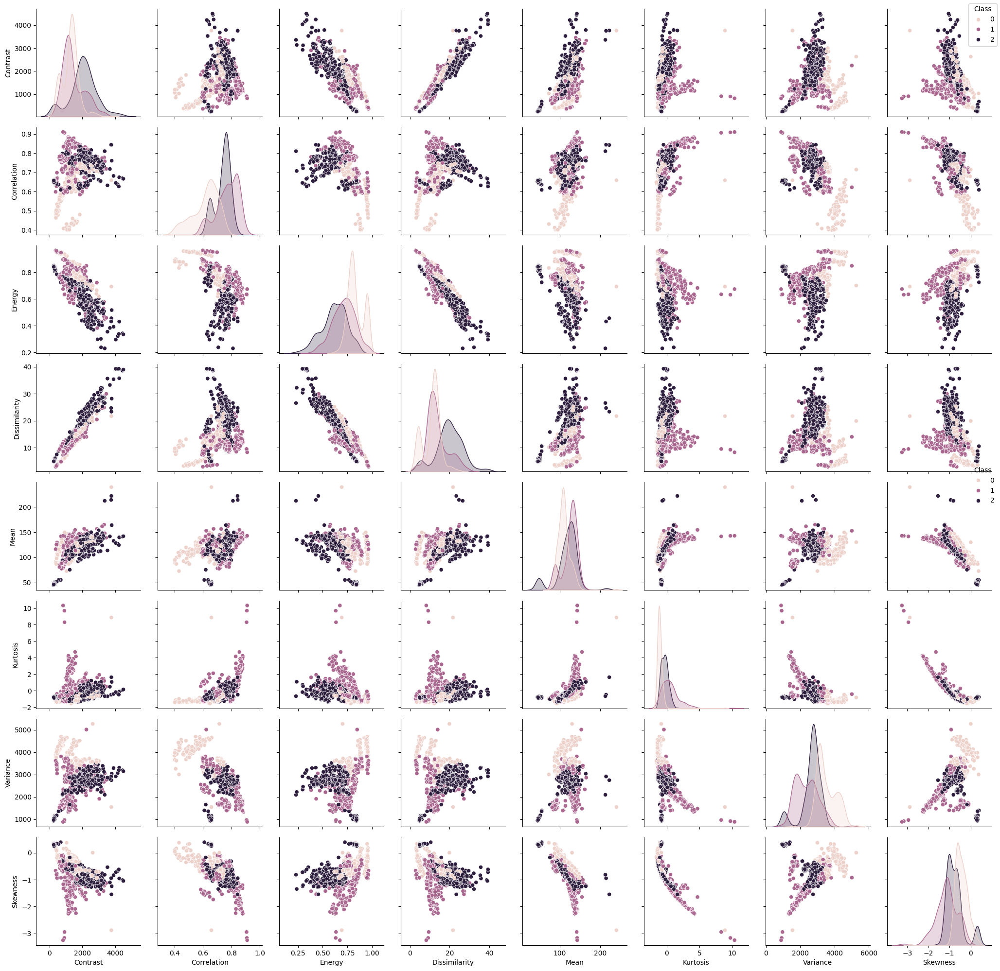

In [19]:
plt.figure(figsize=(18,14))
pairplot = sns.pairplot(df_texture, hue='Class')
for ax in pairplot.axes.flat:
    handles, labels = ax.get_legend_handles_labels()
    if handles:
        pairplot.fig.legend(handles, labels, loc='upper right', title='Class')
        break
#plt.suptitle('Pairplot Feature Analysis by Class')
plt.tight_layout()
plt.show()

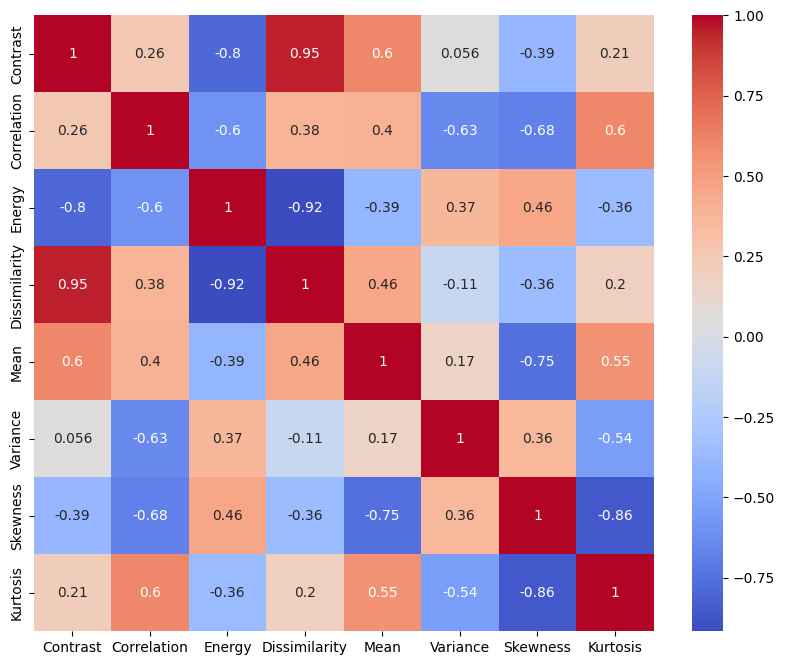

In [20]:
corr_matrix = df_texture[features].corr()
plt.figure(figsize=(10,8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()

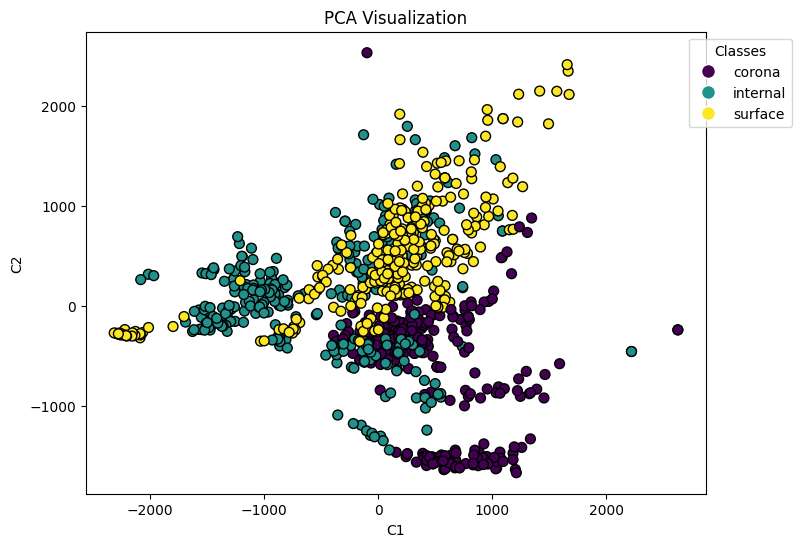

In [21]:
glcm = df_texture[features]

pca = PCA(n_components=2)
X_pca = pca.fit_transform(glcm.values)

# Plot PCA
plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=dataset.labels, cmap='viridis', edgecolor='k', s=50)

# Create a legend
unique_labels = np.unique(dataset.labels)
unique_defects = np.unique(dataset.defect)
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=10) for label in unique_labels]

plt.legend(handles, unique_defects , title='Classes', loc='upper right', bbox_to_anchor=(1.15, 1))
plt.title('PCA Visualization')
plt.xlabel('C1')
plt.ylabel('C2')
plt.show()

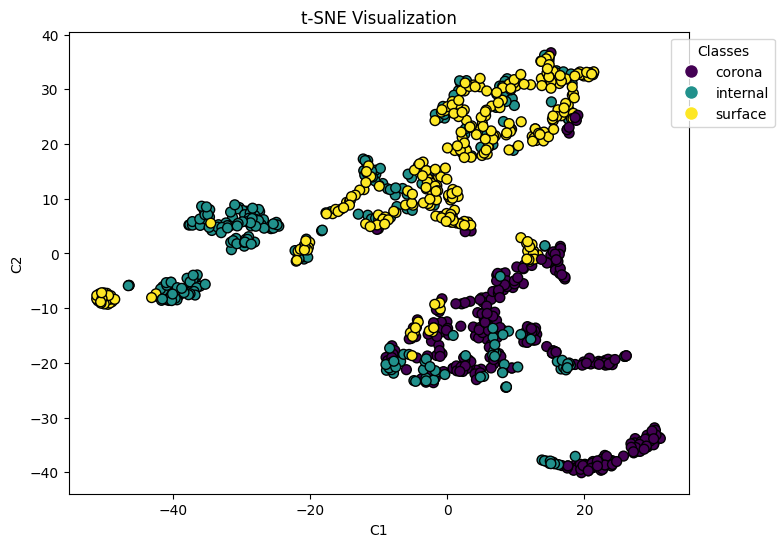

In [22]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(glcm.values)

# Plot t-SNE
plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=dataset.labels, cmap='viridis', edgecolor='k', s=50)

# Create a legend
unique_labels = np.unique(dataset.labels)
unique_defects = np.unique(dataset.defect)
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=10) for label in unique_labels]

plt.legend(handles, unique_defects , title='Classes', loc='upper right', bbox_to_anchor=(1.15, 1))

plt.title('t-SNE Visualization')
plt.xlabel('C1')
plt.ylabel('C2')
plt.show()

C:\Users\jazg2\miniconda3\envs\RL-env\Lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


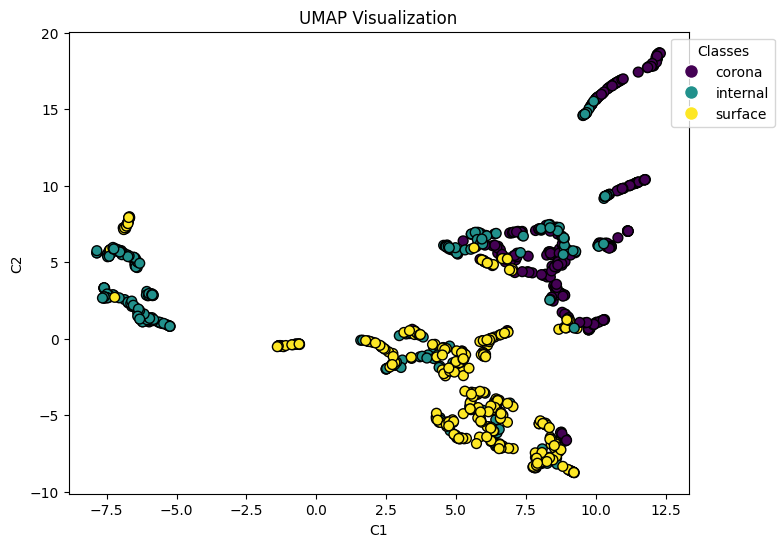

In [23]:
# Apply UMAP
umap_model = umap.UMAP(n_components=2, random_state=42)
X_umap = umap_model.fit_transform(glcm)

# Plot UMAP
plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_umap[:, 0], X_umap[:, 1], c=dataset.labels, cmap='viridis', edgecolor='k', s=50)

# Create a legend
unique_labels = np.unique(dataset.labels)
unique_defects = np.unique(dataset.defect)
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=10) for label in unique_labels]

plt.legend(handles, unique_defects , title='Classes', loc='upper right', bbox_to_anchor=(1.15, 1))

plt.title('UMAP Visualization')
plt.xlabel('C1')
plt.ylabel('C2')
plt.show()

## Contour Feature Analysis

Example for a single PRPD, later will be generalized to get shape features from the whole dataset.

In [39]:
examples = df.drop_duplicates(subset='Class', keep='first')
examples_idxs = examples.index.values
classes = examples['Defect'].values

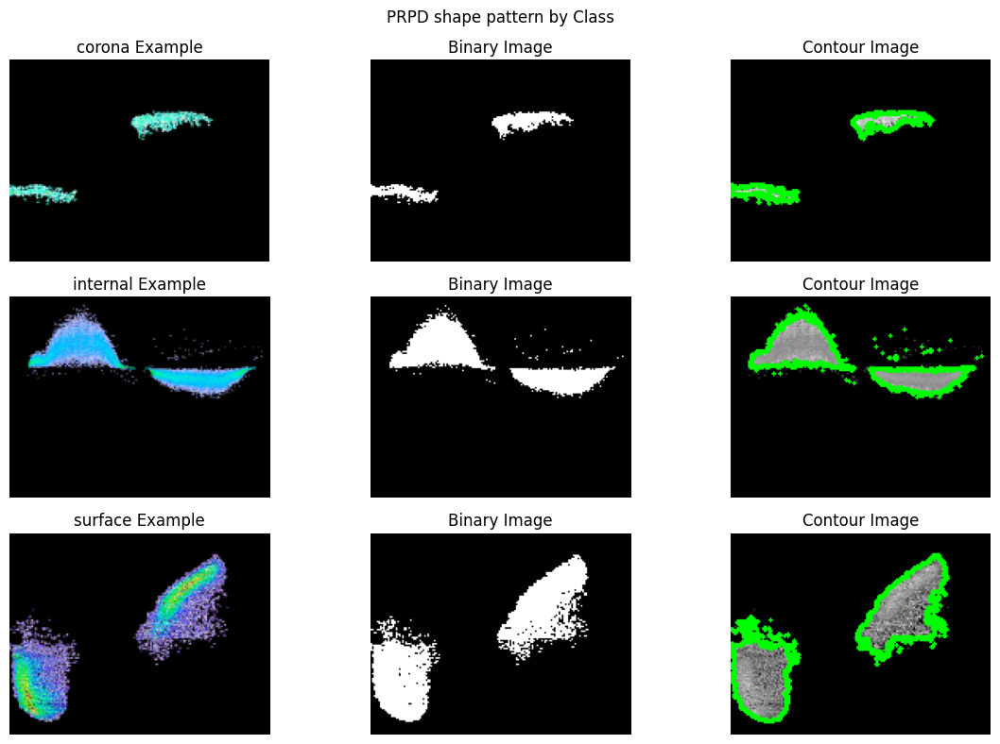

In [59]:
# Setup the figure and axes
fig, ax = plt.subplots(3, 3, figsize=(12, 8))

for i, idx in enumerate(examples_idxs):
    test = dataset.images[idx]
    image = cv2.cvtColor(test, cv2.COLOR_RGB2GRAY)
    _, binary = cv2.threshold(image, 128, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Find contours
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Example: Draw contours on the original image
    contour_image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    cv2.drawContours(contour_image, contours, -1, (0, 255, 0), 2)

    # Display original image
    ax[i,0].imshow(test)
    ax[i,0].set_title('{} Example'.format(classes[i]))
    ax[i,0].axis('off')
    
    # Display binary image
    ax[i,1].imshow(binary, cmap='gray')
    ax[i,1].set_title('Binary Image')
    ax[i,1].axis('off')
    
    # Display contour image
    ax[i,2].imshow(cv2.cvtColor(contour_image, cv2.COLOR_BGR2RGB))
    ax[i,2].set_title('Contour Image')
    ax[i,2].axis('off')
plt.suptitle('PRPD shape pattern by Class')
plt.tight_layout()
plt.show()

Selected geometrical and shape-related features

* *Area and Perimeter*: Basic measures of the size and extent of the shapes.
* *Bounding Box*: Dimensions of the smallest box that can enclose the contour.
* *Aspect Ratio*: Ratio of the width to the height of the bounding rectangle.
* *Extent*: Ratio of contour area to bounding box area.
* *Solidity*: Ratio of contour area to its convex hull area.
* *Equivalent Diameter*: Diameter of a circle with the same area as the contour.
* *Compactness*: How close a contour is to a circle.
* *Eccentricity*: Ratio of the distance between the foci of the ellipse that has the same second moments as the region to its major axis length

In [45]:
for cnt in contours:
    area = cv2.contourArea(cnt)
    perimeter = cv2.arcLength(cnt, True)
    x, y, w, h = cv2.boundingRect(cnt)
    aspect_ratio = w / h
    rect_area = w * h
    # Only obtain features if the object's area is larger than 10 px^2
    if area > 10:
        extent = area / rect_area
        hull = cv2.convexHull(cnt)
        hull_area = cv2.contourArea(hull)
        solidity = (area) / (hull_area)
        equiv_diameter = np.sqrt(4*area / np.pi)
        compactness = 4 * np.pi * area / perimeter**2

        moments = cv2.moments(cnt)

        # Central moments
        mu20 = moments['mu20']
        mu02 = moments['mu02']
        mu11 = moments['mu11']
        
        # Calculate eccentricity
        a = mu20 + mu02
        b = np.sqrt(4 * mu11**2 + (mu20 - mu02)**2)
        major_axis_length = np.sqrt(2) * np.sqrt(a + b)
        minor_axis_length = np.sqrt(2) * np.sqrt(a - b)
        eccentricity = np.sqrt(1 - (minor_axis_length / major_axis_length) ** 2)

        print('Area: {:.3f}'.format(area))
        print('Perimeter: {:.3f}'.format(perimeter))
        print('Aspect ratio: {:.3f}'.format(aspect_ratio))
        print('Extent: {:.3f}'.format(extent))
        print('Solidity: {:.3f}'.format(solidity))
        print('Equivalent diameter: {:.3f}'.format(equiv_diameter))
        print('Compactness: {:.3f}'.format(compactness))
        print('Eccentricity: {:.3f}'.format(eccentricity))
        print()

Area: 1549.500
Perimeter: 313.948
Aspect ratio: 0.646
Extent: 0.568
Solidity: 0.759
Equivalent diameter: 44.417
Compactness: 0.198
Eccentricity: 0.747

Area: 1789.000
Perimeter: 329.848
Aspect ratio: 0.866
Extent: 0.460
Solidity: 0.780
Equivalent diameter: 47.727
Compactness: 0.207
Eccentricity: 0.875



In [46]:
def get_geometric_features(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    _, binary = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    features = {'Area': [], 'Perimeter': [], 'Aspect-ratio': [],
                'Extent': [], 'Solidity': [], 'Equiv-diameter': [],
                'Compactness': [], 'Eccentricity': []}

    # Find contours
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    # Iterate over each found contour in the image
    for cnt in contours:
        area = cv2.contourArea(cnt)
        perimeter = cv2.arcLength(cnt, True)
        x, y, w, h = cv2.boundingRect(cnt)
        aspect_ratio = w / h
        rect_area = w * h
        # Only obtain features if the object's area is different than 0
        if area > 10:
            extent = area / rect_area
            hull = cv2.convexHull(cnt)
            hull_area = cv2.contourArea(hull)
            solidity = (area) / (hull_area)
            equiv_diameter = np.sqrt(4*area / np.pi)
            compactness = 4 * np.pi * area / perimeter**2
            
            moments = cv2.moments(cnt)

            # Central moments
            mu20 = moments['mu20']
            mu02 = moments['mu02']
            mu11 = moments['mu11']
            
            # Calculate eccentricity
            a = mu20 + mu02
            b = np.sqrt(4 * mu11**2 + (mu20 - mu02)**2)
            major_axis_length = np.sqrt(2) * np.sqrt(a + b)
            minor_axis_length = np.sqrt(2) * np.sqrt(a - b)
            eccentricity = np.sqrt(1 - (minor_axis_length / major_axis_length) ** 2)

            features['Area'].append(area), features['Perimeter'].append(perimeter)
            features['Aspect-ratio'].append(aspect_ratio), features['Extent'].append(extent)
            features['Solidity'].append(solidity), features['Equiv-diameter'].append(equiv_diameter)
            features['Compactness'].append(compactness), features['Eccentricity'].append(eccentricity)

    return(np.mean(features['Area']), np.mean(features['Perimeter']), np.mean(features['Aspect-ratio']),
           np.mean(features['Extent']), np.mean(features['Solidity']), np.mean(features['Equiv-diameter']),
           np.mean(features['Compactness']), np.mean(features['Eccentricity']))

In [47]:
geometric_features = []

for idx, image in enumerate(dataset.images):
    #Calculate features for RGB image
    features = get_geometric_features(image)
    geometric_features.append({'Filename': dataset.filenames[idx], 'Area': features[0],
                               'Perimeter': features[1], 'Aspect-ratio': features[2],
                               'Extent': features[3], 'Solidity': features[4], 
                               'Equiv-diameter': features[5], 'Compactness': features[6],
                               'Eccentricity': features[7]})

# Convert the list of dictionaries to a DataFrame
geometric_df = pd.DataFrame(geometric_features)
geometric_df.set_index('Filename', inplace=True)  # Set filename as the index to match original_df

In [48]:
df_geometric = df.join(geometric_df, on='Filename', how='left')

In [50]:
df_geometric.head()

,Filename,Motor,Defect,Split,Class,Area,Perimeter,Aspect-ratio,Extent,Solidity,Equiv-diameter,Compactness,Eccentricity
0,C:\Users\jazg2\OneDrive\Documents\Pesquisa_Mes...,REAL2,corona,Train-val,0,280.25,157.388346,3.321078,0.403147,0.626678,18.753422,0.139514,0.980525
1,C:\Users\jazg2\OneDrive\Documents\Pesquisa_Mes...,REAL2,corona,Train-val,0,235.75,136.831997,4.636364,0.419325,0.650653,17.294068,0.158986,0.990415
2,C:\Users\jazg2\OneDrive\Documents\Pesquisa_Mes...,REAL2,corona,Train-val,0,317.75,161.559919,3.226244,0.426088,0.638513,19.866024,0.153818,0.981563
3,C:\Users\jazg2\OneDrive\Documents\Pesquisa_Mes...,REAL2,corona,Train-val,0,216.25,135.589357,4.144444,0.388042,0.618845,16.509287,0.145878,0.989526
4,C:\Users\jazg2\OneDrive\Documents\Pesquisa_Mes...,REAL2,corona,Train-val,0,207.25,134.831997,3.238636,0.357340,0.601597,16.127598,0.143814,0.985392


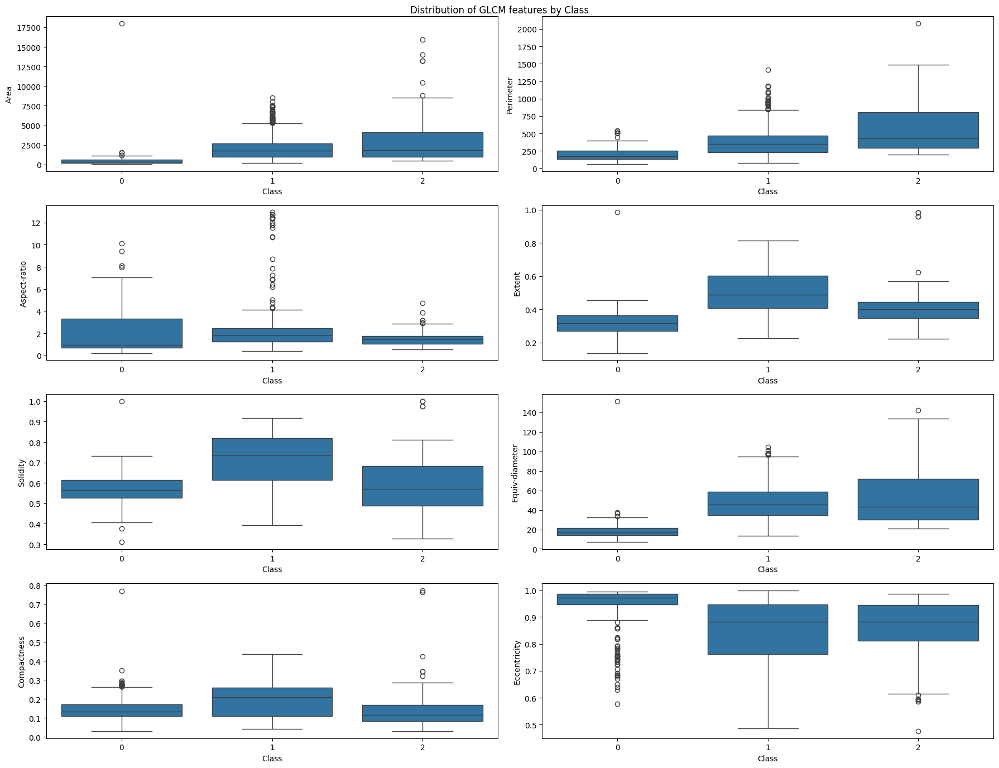

In [53]:
plt.figure(figsize=(18, 14))

features = ['Area', 'Perimeter', 'Aspect-ratio', 'Extent', 'Solidity', 'Equiv-diameter', 'Compactness', 'Eccentricity']

for idx, feature in enumerate(features):
    plt.subplot(4,2,idx+1)
    sns.boxplot(x='Class', y=feature, data=df_geometric)
plt.suptitle('Distribution of GLCM features by Class')
plt.tight_layout()
plt.show()

<Figure size 1800x1400 with 0 Axes>

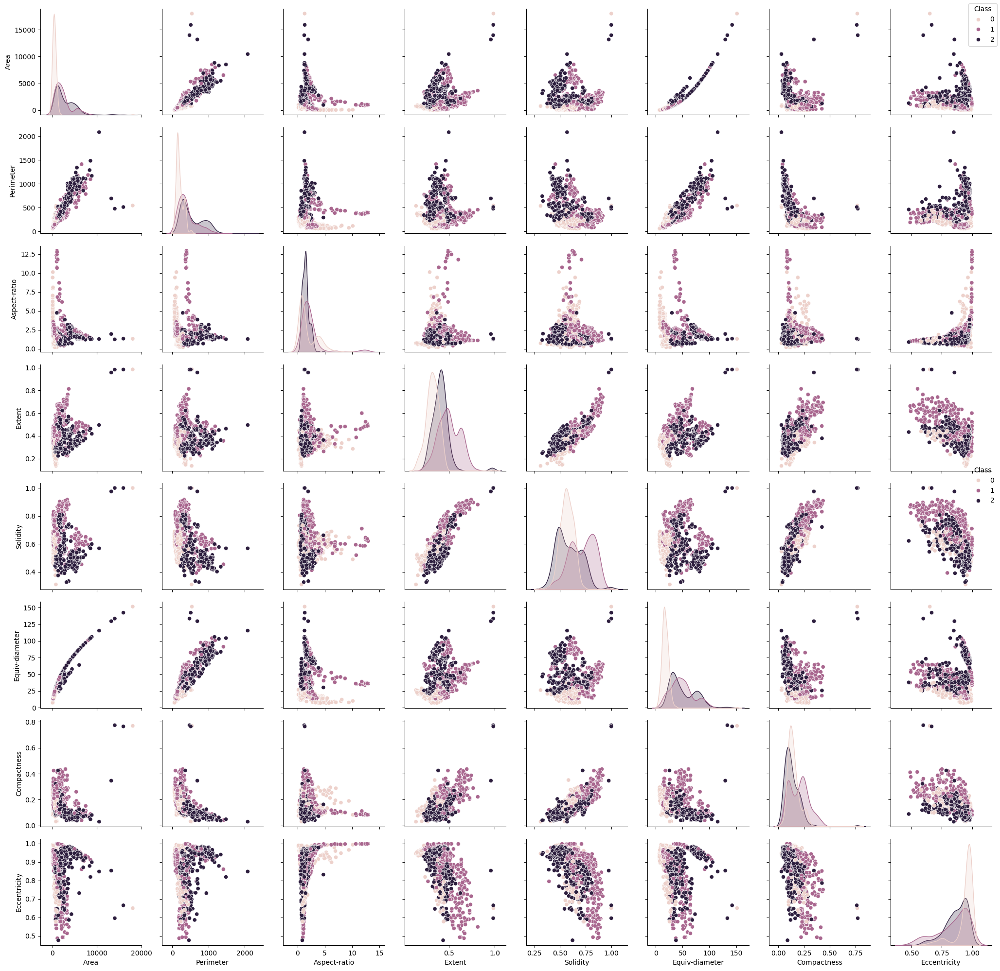

In [54]:
plt.figure(figsize=(18,14))
pairplot = sns.pairplot(df_geometric, hue='Class')
for ax in pairplot.axes.flat:
    handles, labels = ax.get_legend_handles_labels()
    if handles:
        pairplot.fig.legend(handles, labels, loc='upper right', title='Class')
        break
#plt.suptitle('Pairplot Feature Analysis by Class')
plt.tight_layout()
plt.show()

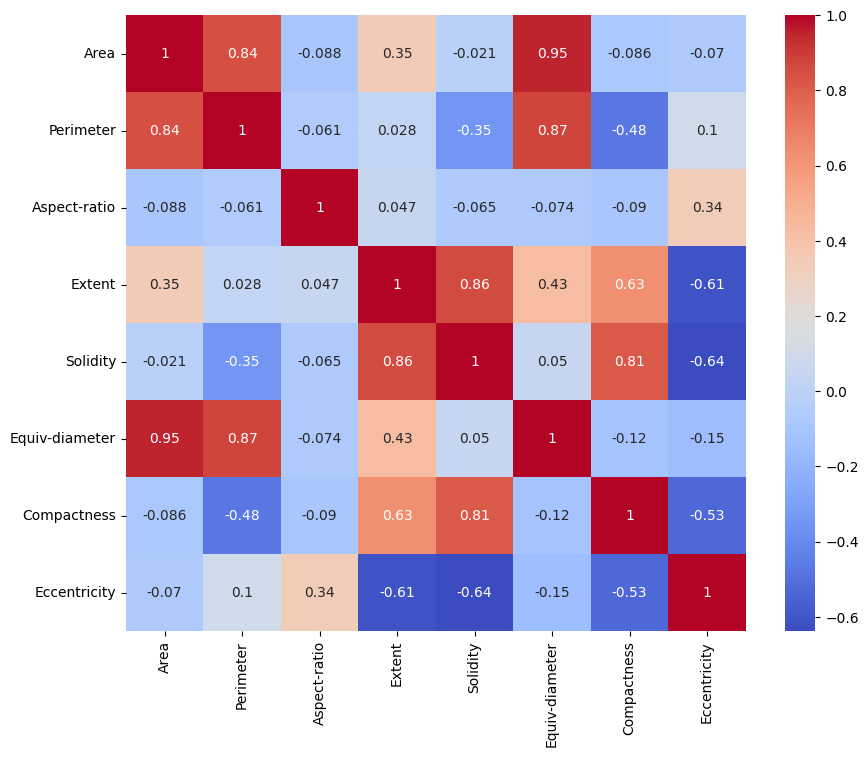

In [55]:
corr_matrix = df_geometric[features].corr()
plt.figure(figsize=(10,8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()

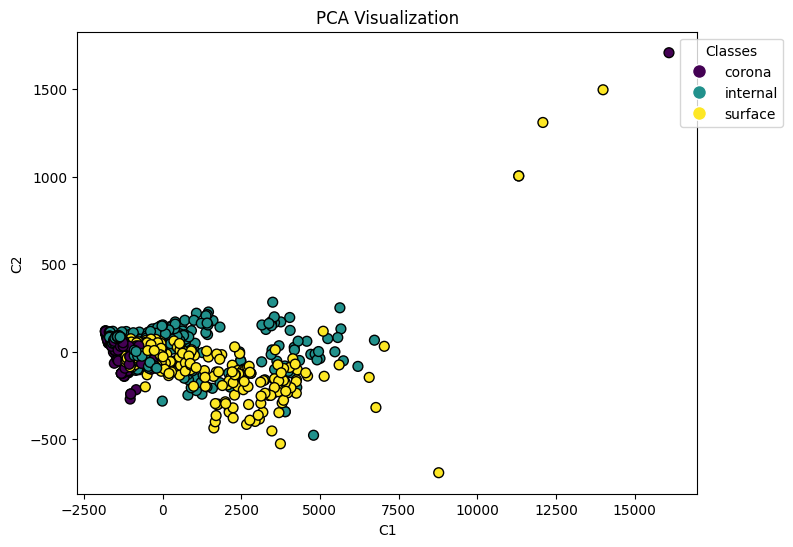

In [56]:
geometric = df_geometric[features]

pca = PCA(n_components=2)
X_pca = pca.fit_transform(geometric.values)

# Plot PCA
plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=dataset.labels, cmap='viridis', edgecolor='k', s=50)

# Create a legend
unique_labels = np.unique(dataset.labels)
unique_defects = np.unique(dataset.defect)
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=10) for label in unique_labels]

plt.legend(handles, unique_defects , title='Classes', loc='upper right', bbox_to_anchor=(1.15, 1))
plt.title('PCA Visualization')
plt.xlabel('C1')
plt.ylabel('C2')
plt.show()

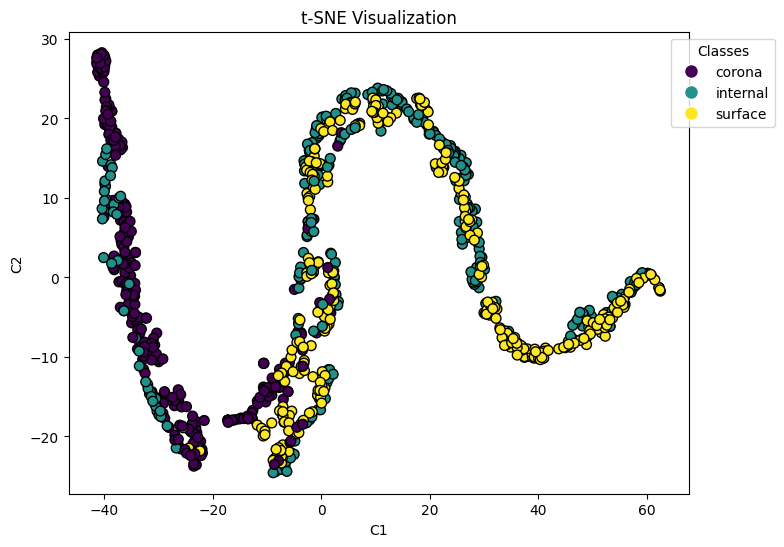

In [57]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(geometric.values)

# Plot t-SNE
plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=dataset.labels, cmap='viridis', edgecolor='k', s=50)

# Create a legend
unique_labels = np.unique(dataset.labels)
unique_defects = np.unique(dataset.defect)
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=10) for label in unique_labels]

plt.legend(handles, unique_defects , title='Classes', loc='upper right', bbox_to_anchor=(1.15, 1))

plt.title('t-SNE Visualization')
plt.xlabel('C1')
plt.ylabel('C2')
plt.show()

C:\Users\jazg2\miniconda3\envs\RL-env\Lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


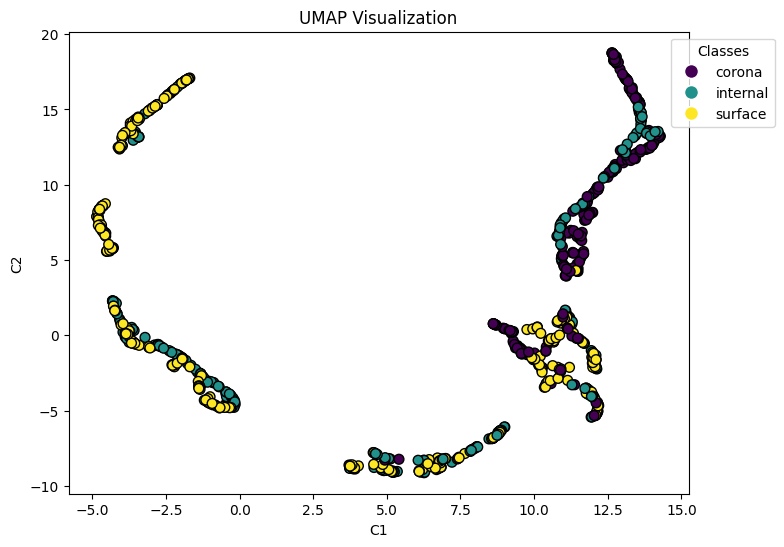

In [58]:
# Apply UMAP
umap_model = umap.UMAP(n_components=2, random_state=42)
X_umap = umap_model.fit_transform(geometric)

# Plot UMAP
plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_umap[:, 0], X_umap[:, 1], c=dataset.labels, cmap='viridis', edgecolor='k', s=50)

# Create a legend
unique_labels = np.unique(dataset.labels)
unique_defects = np.unique(dataset.defect)
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=10) for label in unique_labels]

plt.legend(handles, unique_defects , title='Classes', loc='upper right', bbox_to_anchor=(1.15, 1))

plt.title('UMAP Visualization')
plt.xlabel('C1')
plt.ylabel('C2')
plt.show()

## Texture & Contour Feature Analysis

In [64]:
df_withFeatures = df.join(geometric_df, on='Filename', how='left').join(glcm_df, on='Filename', how='left')

In [65]:
df_withFeatures.head()

,Filename,Motor,Defect,Split,Class,Area,Perimeter,Aspect-ratio,Extent,Solidity,...,Compactness,Eccentricity,Contrast,Correlation,Energy,Dissimilarity,Mean,Kurtosis,Variance,Skewness
0,C:\Users\jazg2\OneDrive\Documents\Pesquisa_Mes...,REAL2,corona,Train-val,0,280.25,157.388346,3.321078,0.403147,0.626678,...,0.139514,0.980525,815.526694,0.610691,0.940221,5.617074,140.764192,-0.896629,4308.933478,-0.629142
1,C:\Users\jazg2\OneDrive\Documents\Pesquisa_Mes...,REAL2,corona,Train-val,0,235.75,136.831997,4.636364,0.419325,0.650653,...,0.158986,0.990415,688.415765,0.553298,0.945413,4.973393,124.705160,-1.108421,4312.773020,-0.388756
2,C:\Users\jazg2\OneDrive\Documents\Pesquisa_Mes...,REAL2,corona,Train-val,0,317.75,161.559919,3.226244,0.426088,0.638513,...,0.153818,0.981563,856.246417,0.622638,0.933850,5.984863,137.029126,-0.964382,4578.599152,-0.590478
3,C:\Users\jazg2\OneDrive\Documents\Pesquisa_Mes...,REAL2,corona,Train-val,0,216.25,135.589357,4.144444,0.388042,0.618845,...,0.145878,0.989526,641.557232,0.548016,0.949251,4.658152,125.724230,-1.089167,4118.454072,-0.395278
4,C:\Users\jazg2\OneDrive\Documents\Pesquisa_Mes...,REAL2,corona,Train-val,0,207.25,134.831997,3.238636,0.357340,0.601597,...,0.143814,0.985392,605.478426,0.564366,0.947994,4.504603,119.644993,-1.182020,4349.292696,-0.329122


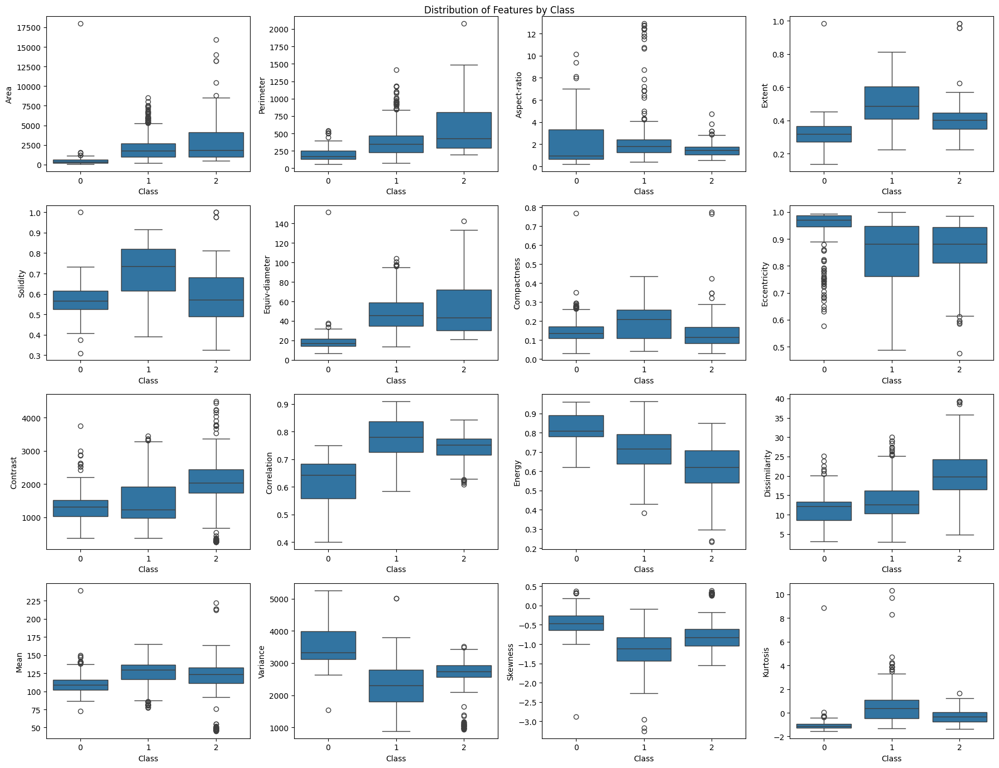

In [66]:
plt.figure(figsize=(18, 14))

features = ['Area', 'Perimeter', 'Aspect-ratio', 'Extent', 'Solidity', 'Equiv-diameter', 'Compactness', 'Eccentricity']

features +=['Contrast', 'Correlation', 'Energy', 'Dissimilarity', 'Mean', 'Variance', 'Skewness', 'Kurtosis']

for idx, feature in enumerate(features):
    plt.subplot(4,4,idx+1)
    sns.boxplot(x='Class', y=feature, data=df_withFeatures)
plt.suptitle('Distribution of Features by Class')
plt.tight_layout()
plt.show()

<Figure size 1800x1400 with 0 Axes>

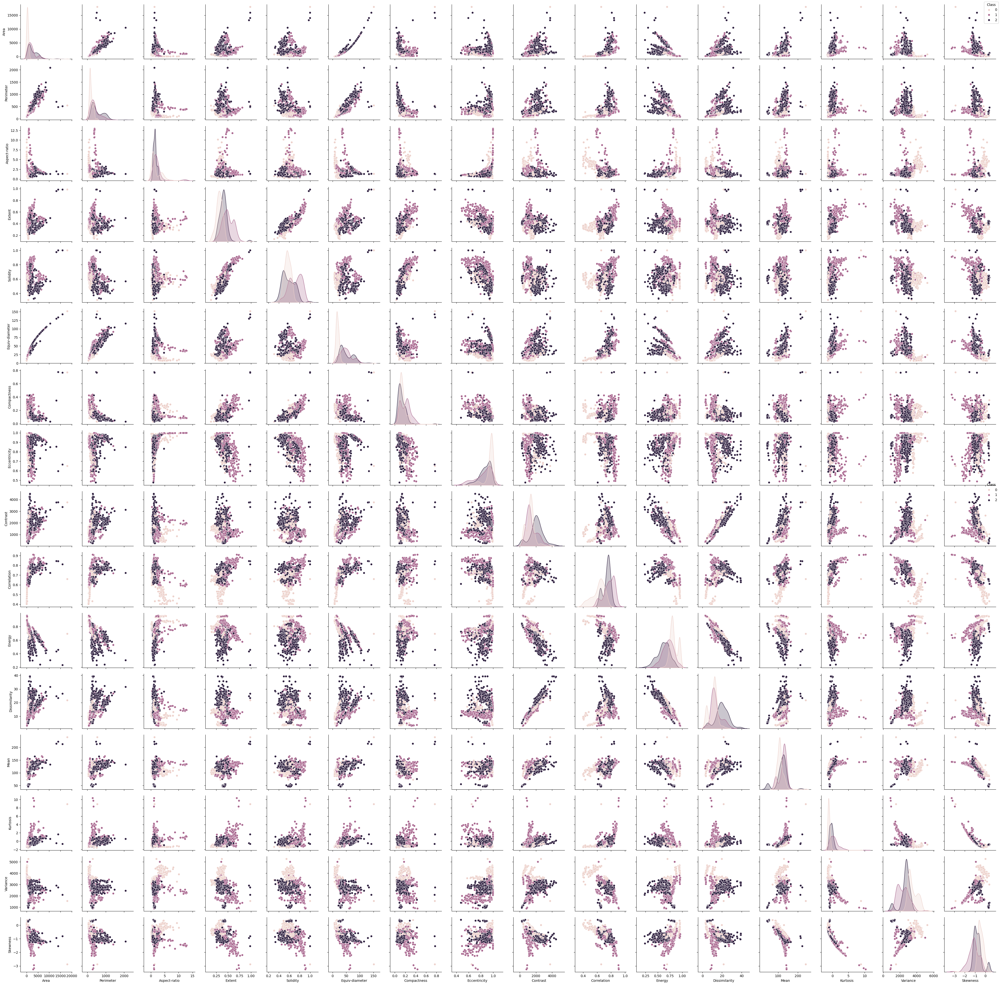

In [67]:
plt.figure(figsize=(18,14))
pairplot = sns.pairplot(df_withFeatures, hue='Class')
for ax in pairplot.axes.flat:
    handles, labels = ax.get_legend_handles_labels()
    if handles:
        pairplot.fig.legend(handles, labels, loc='upper right', title='Class')
        break
#plt.suptitle('Pairplot Feature Analysis by Class')
plt.tight_layout()
plt.show()

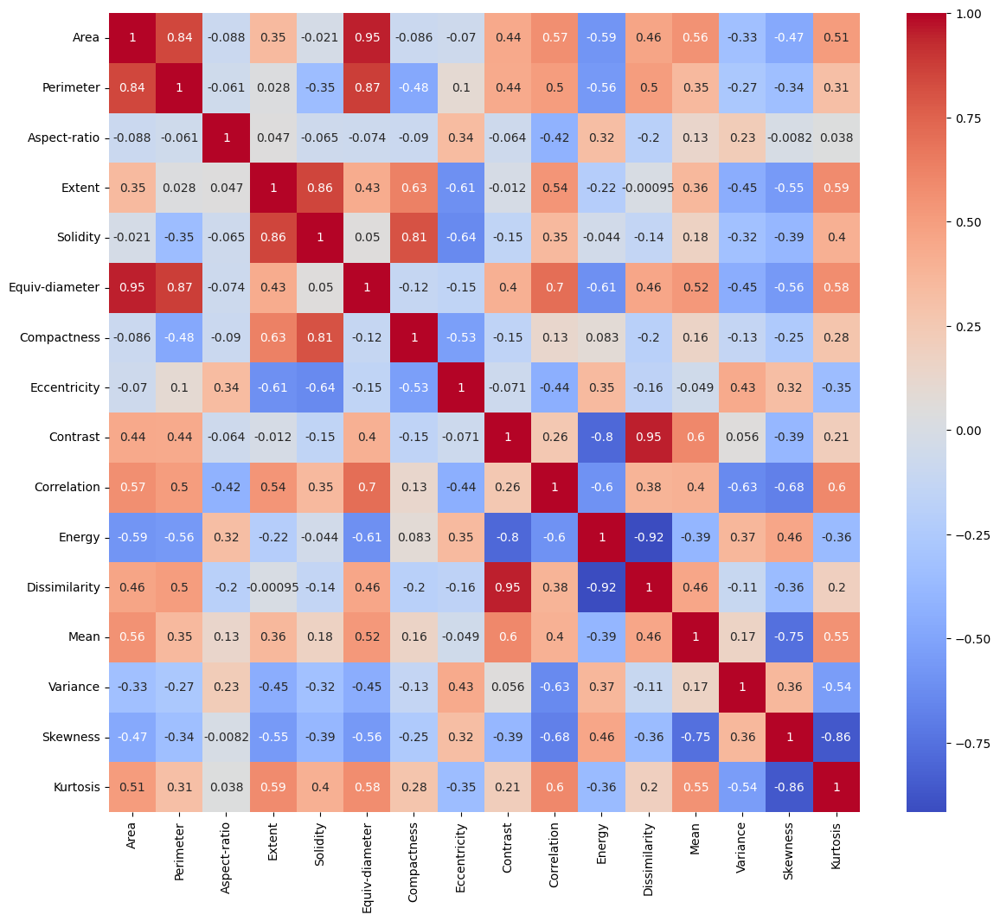

In [69]:
corr_matrix = df_withFeatures[features].corr()
plt.figure(figsize=(14,12))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()

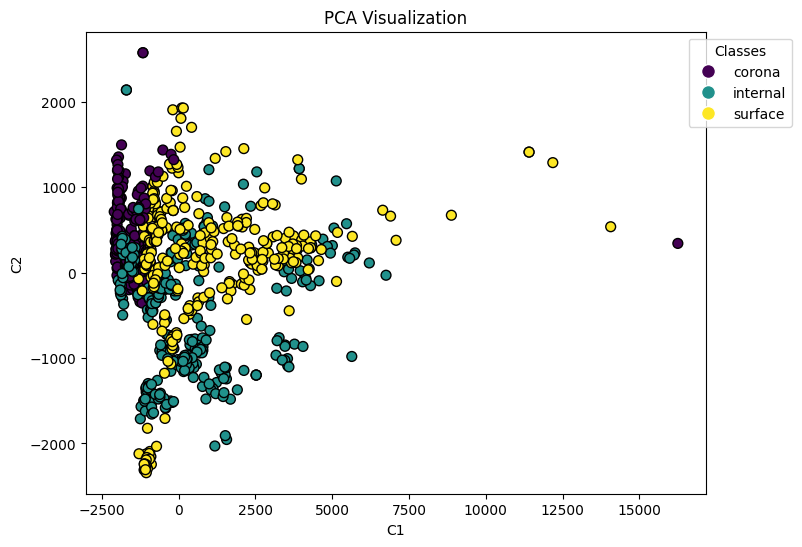

In [71]:
text_shape_features = df_withFeatures[features]

pca = PCA(n_components=2)
X_pca = pca.fit_transform(text_shape_features.values)

# Plot PCA
plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=dataset.labels, cmap='viridis', edgecolor='k', s=50)

# Create a legend
unique_labels = np.unique(dataset.labels)
unique_defects = np.unique(dataset.defect)
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=10) for label in unique_labels]

plt.legend(handles, unique_defects , title='Classes', loc='upper right', bbox_to_anchor=(1.15, 1))
plt.title('PCA Visualization')
plt.xlabel('C1')
plt.ylabel('C2')
plt.show()

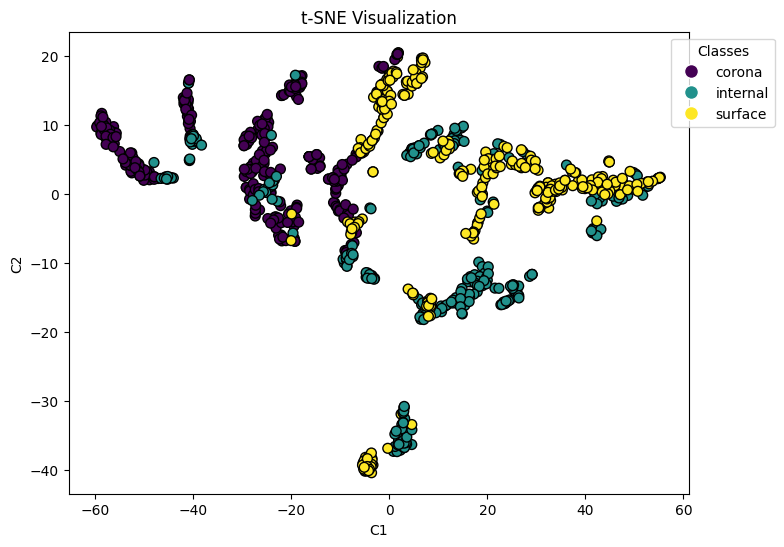

In [73]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(text_shape_features)

# Plot t-SNE
plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=dataset.labels, cmap='viridis', edgecolor='k', s=50)

# Create a legend
unique_labels = np.unique(dataset.labels)
unique_defects = np.unique(dataset.defect)
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=10) for label in unique_labels]

plt.legend(handles, unique_defects , title='Classes', loc='upper right', bbox_to_anchor=(1.15, 1))

plt.title('t-SNE Visualization')
plt.xlabel('C1')
plt.ylabel('C2')
plt.show()

C:\Users\jazg2\miniconda3\envs\RL-env\Lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


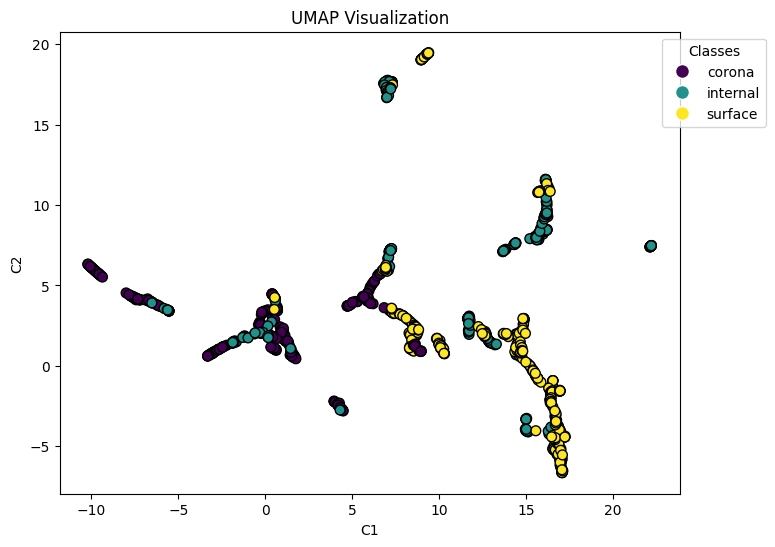

In [74]:
# Apply UMAP
umap_model = umap.UMAP(n_components=2, random_state=42)
X_umap = umap_model.fit_transform(text_shape_features)

# Plot UMAP
plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_umap[:, 0], X_umap[:, 1], c=dataset.labels, cmap='viridis', edgecolor='k', s=50)

# Create a legend
unique_labels = np.unique(dataset.labels)
unique_defects = np.unique(dataset.defect)
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=10) for label in unique_labels]

plt.legend(handles, unique_defects , title='Classes', loc='upper right', bbox_to_anchor=(1.15, 1))

plt.title('UMAP Visualization')
plt.xlabel('C1')
plt.ylabel('C2')
plt.show()